 %%[markdown]

In [1]:
from optuna.visualization.matplotlib import plot_param_importances
from optuna.visualization.matplotlib import plot_optimization_history
import numpy as np
import pandas as pd
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
# import tensorflow as tf
import os
import gc

from sklearn import set_config
from sklearn.base import clone
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error
from lightgbm import LGBMRegressor
import optuna
from optuna.integration import LightGBMPruningCallback
import lightgbm as lgb

# Make directory for save model path


sns.set_theme(style='white', palette='viridis')
pal = sns.color_palette('viridis')

pd.set_option('display.max_rows', 100)
set_config(transform_output='pandas')
pd.options.mode.chained_assignment = None

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


 Read the data

In [2]:
dtypes = {
    'stock_id': np.uint8,
    'date_id': np.uint16,
    'seconds_in_bucket': np.uint16,
    'imbalance_buy_sell_flag': np.int8,
    'time_id': np.uint16,
}

train = pd.read_csv('D:/OneDrive/NEU/CS6140/optiver-trading-at-the-close/train.csv',
                    dtype=dtypes).drop(['row_id', 'time_id'], axis=1)
test = pd.read_csv('D:/OneDrive/NEU/CS6140/optiver-trading-at-the-close/test.csv',
                   dtype=dtypes).drop(['row_id', 'time_id'], axis=1)
train.info()
print(train.head())
gc.collect()

X = train[~train.target.isna()]
y = X.pop('target')

X.info()
print(X.head())
seed = 42
tss = TimeSeriesSplit(10)

os.environ['PYTHONHASHSEED'] = '42'

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5237980 entries, 0 to 5237979
Data columns (total 15 columns):
 #   Column                   Dtype  
---  ------                   -----  
 0   stock_id                 uint8  
 1   date_id                  uint16 
 2   seconds_in_bucket        uint16 
 3   imbalance_size           float64
 4   imbalance_buy_sell_flag  int8   
 5   reference_price          float64
 6   matched_size             float64
 7   far_price                float64
 8   near_price               float64
 9   bid_price                float64
 10  bid_size                 float64
 11  ask_price                float64
 12  ask_size                 float64
 13  wap                      float64
 14  target                   float64
dtypes: float64(11), int8(1), uint16(2), uint8(1)
memory usage: 469.6 MB
   stock_id  date_id  seconds_in_bucket  imbalance_size  \
0         0        0                  0      3180602.69   
1         1        0                  0       1666

 Set the objective function for Optuna study and running trials

In [3]:
def objective(trial, X, y):
    param_grid = {
        "n_estimators": trial.suggest_categorical("n_estimators", [10000]),
        "learning_rate": trial.suggest_float("learning_rate", 0.001, 0.3)
    }
    cv = tss
    cv_scores = np.empty(10)
    for fold, (train_idx, val_idx) in enumerate(cv.split(X, y)):
        # define train set
        X_train = X.iloc[train_idx]
        y_train = y.iloc[train_idx]

        # define validation set
        X_val = X.iloc[val_idx]
        y_val = y.iloc[val_idx]

        model = LGBMRegressor(random_state=seed, objective='mse',
                              device_type='gpu', early_stopping_rounds=100, **param_grid)
        # train model
        model.fit(X_train, y_train, eval_set=[(X_val, y_val)],  callbacks=[
                  LightGBMPruningCallback(trial, 'l2')])
        val_preds = model.predict(X_val)

        # evaluate model for a fold
        val_score = mean_absolute_error(y_val, val_preds)
        cv_scores[fold] = val_score
    return np.mean(cv_scores)


study = optuna.create_study(direction='minimize', study_name='LGBM Regressor')
def func(trial): return objective(trial, X, y)


study.optimize(func, n_trials=100)

print(f"\tBest value (mse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")

[I 2023-12-01 21:45:41,634] A new study created in memory with name: LGBM Regressor


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.011633 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[7]	valid_0's l2: 81.3933
[LightGBM] [Warning] 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[17]	valid_0's l2: 116.214
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021238 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[8]	valid_0's l2: 97.0143
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.028584 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[17]	valid_0's l2: 111.581
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.034599 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[31]	valid_0's l2: 79.7889
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.038443 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 74.5125
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.048168 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[37]	valid_0's l2: 93.9771
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.052939 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 87.9033
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.097131 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[16]	valid_0's l2: 79.2541
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.061932 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[16]	valid_0's l2: 78.4279


[I 2023-12-01 21:46:43,444] Trial 0 finished with value: 6.4416188726845505 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2787958602426157}. Best is trial 0 with value: 6.4416188726845505.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008035 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[19]	valid_0's l2: 81.1384
[LightGBM] [Warning]

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[20]	valid_0's l2: 116.126
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021486 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 96.8083
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.028172 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[85]	valid_0's l2: 111.396
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.034924 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[50]	valid_0's l2: 79.7558
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.044276 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[79]	valid_0's l2: 74.3782
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.048980 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[97]	valid_0's l2: 93.9911
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.052062 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[20]	valid_0's l2: 87.8359
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.056112 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[25]	valid_0's l2: 79.2759
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.063009 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[37]	valid_0's l2: 78.4045


[I 2023-12-01 21:47:57,892] Trial 1 finished with value: 6.4382479434877125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.15833224898969644}. Best is trial 1 with value: 6.4382479434877125.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008789 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[23]	valid_0's l2: 81.1347
[LightGBM] [Warning]

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[22]	valid_0's l2: 116.25
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021129 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[12]	valid_0's l2: 96.9409
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.026686 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[19]	valid_0's l2: 111.587
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.033116 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[42]	valid_0's l2: 79.8964
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.039229 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[37]	valid_0's l2: 74.4126
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.043433 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[74]	valid_0's l2: 94.0912
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.048771 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[20]	valid_0's l2: 87.6642
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.059196 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 79.3484
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.068252 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[37]	valid_0's l2: 78.3116


[I 2023-12-01 21:49:01,854] Trial 2 finished with value: 6.440079828805645 and parameters: {'n_estimators': 10000, 'learning_rate': 0.20427693458439664}. Best is trial 1 with value: 6.4382479434877125.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009972 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[2179]	valid_0's l2: 80.9781
[LightGBM] [Warnin

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[4099]	valid_0's l2: 115.675
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.020273 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[1815]	valid_0's l2: 96.7956
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.026042 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[5449]	valid_0's l2: 111.179
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.033294 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[5160]	valid_0's l2: 79.6936
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.043807 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[4057]	valid_0's l2: 74.394
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.044297 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[4807]	valid_0's l2: 93.9875
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.049794 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[2262]	valid_0's l2: 87.7225
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.054327 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[2374]	valid_0's l2: 79.2147
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.067597 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[4496]	valid_0's l2: 78.2272


[I 2023-12-01 22:27:14,618] Trial 3 finished with value: 6.434352457298634 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0018958897208476253}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008600 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1357]	valid_0's l2: 80.9752
[LightGBM] [Warnin

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[2332]	valid_0's l2: 115.665
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021107 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[1105]	valid_0's l2: 96.787
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.025882 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[2949]	valid_0's l2: 111.169
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.031985 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[2552]	valid_0's l2: 79.7034
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.038999 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[2463]	valid_0's l2: 74.3941
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.043403 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[3135]	valid_0's l2: 93.9718
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.051433 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[1273]	valid_0's l2: 87.7143
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.057443 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[1293]	valid_0's l2: 79.2015
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.063744 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[2723]	valid_0's l2: 78.2162


[I 2023-12-01 22:48:50,034] Trial 4 finished with value: 6.434460458157986 and parameters: {'n_estimators': 10000, 'learning_rate': 0.0035013234349213036}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008831 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[10]	valid_0's l2: 81.3598
[LightGBM] [Warning]

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[22]	valid_0's l2: 116.307
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.020659 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[8]	valid_0's l2: 97.0561
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.027096 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[34]	valid_0's l2: 111.357
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.035949 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 79.8679
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.043798 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[33]	valid_0's l2: 74.4937
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.043613 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[34]	valid_0's l2: 94.0697
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.049399 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[13]	valid_0's l2: 87.8918
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.057778 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[21]	valid_0's l2: 79.2313
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.063961 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[33]	valid_0's l2: 78.343


[I 2023-12-01 22:49:50,196] Trial 5 finished with value: 6.440934460550421 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2486323884220534}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:49:50,755] Trial 6 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008694 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[28]	valid_0's l2: 116.13
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.022197 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[12]	valid_0's l2: 97.04
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.029423 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[36]	valid_0's l2: 111.459
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.031849 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[49]	valid_0's l2: 79.7332
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.041679 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[46]	valid_0's l2: 74.4411
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.042570 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[62]	valid_0's l2: 94.0734
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.051628 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[16]	valid_0's l2: 87.9267
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.057263 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 79.2757
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.061041 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[62]	valid_0's l2: 78.2866


[I 2023-12-01 22:50:57,466] Trial 7 finished with value: 6.440719668575009 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2098134663632987}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:50:58,070] Trial 8 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007675 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:50:58,649] Trial 9 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009794 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:50:59,234] Trial 10 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009132 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:50:59,816] Trial 11 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008880 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:51:00,455] Trial 12 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:01,126] Trial 13 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008981 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:01,686] Trial 14 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008318 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:51:02,314] Trial 15 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:03,020] Trial 16 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007350 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:03,619] Trial 17 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007999 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:04,233] Trial 18 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008905 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:04,885] Trial 19 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007759 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:05,459] Trial 20 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009260 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:51:06,086] Trial 21 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008342 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:51:06,738] Trial 22 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009129 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:51:07,328] Trial 23 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009383 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:51:07,969] Trial 24 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:08,609] Trial 25 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008479 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:09,193] Trial 26 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009119 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:09,768] Trial 27 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008404 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:10,447] Trial 28 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008094 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:11,085] Trial 29 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008713 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:11,677] Trial 30 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008795 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:51:12,329] Trial 31 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009212 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:51:13,043] Trial 32 pruned. Trial was pruned at iteration 2.


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008248 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[22]	valid_0's l2: 116.339
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.023041 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[13]	valid_0's l2: 96.8696
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.027793 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[21]	valid_0's l2: 111.41
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.035090 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[27]	valid_0's l2: 79.8019
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.040399 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 74.5089
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.044975 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 94.0628
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.053495 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[12]	valid_0's l2: 87.8905
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.061273 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 79.1209
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.068770 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[38]	valid_0's l2: 78.365


[I 2023-12-01 22:52:16,482] Trial 33 finished with value: 6.441252001235725 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2804232350763634}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.013859 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[9]	valid_0's l2: 81.1989
[LightGBM] [Warning] 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[20]	valid_0's l2: 116.144
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.020102 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[13]	valid_0's l2: 96.9609
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.029154 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[31]	valid_0's l2: 111.567
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.034541 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 79.8495
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.038205 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[46]	valid_0's l2: 74.5014
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.048087 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[31]	valid_0's l2: 94.0989
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.052642 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[10]	valid_0's l2: 87.9152
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.064597 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[14]	valid_0's l2: 79.1482
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.065522 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[28]	valid_0's l2: 78.2396


[I 2023-12-01 22:53:19,527] Trial 34 finished with value: 6.440905236637404 and parameters: {'n_estimators': 10000, 'learning_rate': 0.26287310365495703}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:20,133] Trial 35 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008222 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:20,770] Trial 36 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007982 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:21,357] Trial 37 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008833 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:22,010] Trial 38 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:22,689] Trial 39 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008304 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:23,276] Trial 40 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008531 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:23,986] Trial 41 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009821 secs. 0 sparse feature groups


[I 2023-12-01 22:53:24,792] Trial 42 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007592 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightG

[I 2023-12-01 22:53:25,635] Trial 43 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009940 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:53:26,239] Trial 44 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.013918 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:53:26,987] Trial 45 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:27,571] Trial 46 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.010244 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:28,190] Trial 47 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:28,876] Trial 48 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008389 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:29,469] Trial 49 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008475 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:30,275] Trial 50 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008299 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:31,024] Trial 51 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008520 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:53:31,639] Trial 52 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008033 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:32,288] Trial 53 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008536 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:53:33,019] Trial 54 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008545 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:33,820] Trial 55 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008451 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:34,751] Trial 56 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.010441 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:53:35,422] Trial 57 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:36,041] Trial 58 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008567 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:36,626] Trial 59 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008797 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:37,322] Trial 60 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008478 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:37,972] Trial 61 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008015 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:38,652] Trial 62 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007779 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation sc

[I 2023-12-01 22:53:39,401] Trial 63 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007646 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:40,098] Trial 64 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009388 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:40,747] Trial 65 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009125 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:41,530] Trial 66 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008995 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:42,186] Trial 67 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007851 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:53:42,834] Trial 68 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:43,479] Trial 69 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009279 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:53:44,075] Trial 70 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007672 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:53:44,920] Trial 71 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.051334 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:45,841] Trial 72 pruned. Trial was pruned at iteration 10.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.016151 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:46,496] Trial 73 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007702 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:47,148] Trial 74 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008178 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:53:47,879] Trial 75 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009614 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[9]	valid_0's l2: 81.3317
[LightGBM] [Warning] 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[13]	valid_0's l2: 116.275
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021626 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[11]	valid_0's l2: 96.9255
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.026550 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 111.549
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.032457 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[33]	valid_0's l2: 79.8277
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.037292 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[24]	valid_0's l2: 74.5016
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.042912 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[24]	valid_0's l2: 94.0124
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.048931 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[7]	valid_0's l2: 87.9342
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.065249 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 79.3047
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.061112 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[18]	valid_0's l2: 78.4646


[I 2023-12-01 22:54:44,847] Trial 76 finished with value: 6.441606453549847 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28919990726929956}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.035958 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[10]	valid_0's l2: 81.329
[LightGBM] [Warning] 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 12 is already repo

Early stopping, best iteration is:
[10]	valid_0's l2: 116.448
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.021938 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[9]	valid_0's l2: 96.9739
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.026349 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[26]	valid_0's l2: 111.681
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.033436 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 79.9127
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.038571 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[25]	valid_0's l2: 74.5215
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.043646 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[34]	valid_0's l2: 94.0392
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.049204 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[7]	valid_0's l2: 88.1164
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.056194 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[9]	valid_0's l2: 79.3201
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.071952 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 78.2595


[I 2023-12-01 22:55:42,149] Trial 77 finished with value: 6.443106463001678 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2847815676295523}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:55:42,703] Trial 78 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009714 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:55:43,333] Trial 79 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.007668 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:55:43,944] Trial 80 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.025343 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[9]	valid_0's l2: 81.3116
[LightGBM] [Warning] 

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 8 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 9 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 10 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 11 is already repor

Early stopping, best iteration is:
[13]	valid_0's l2: 116.278
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.019833 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[11]	valid_0's l2: 96.9255
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.027515 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[41]	valid_0's l2: 111.623
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.033300 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 79.8651
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.037843 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[21]	valid_0's l2: 74.4945
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.043904 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 94.0946
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.049193 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[7]	valid_0's l2: 87.9343
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.055798 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 7 is already reporte

Early stopping, best iteration is:
[16]	valid_0's l2: 79.2459
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.063978 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[16]	valid_0's l2: 78.4284


[I 2023-12-01 22:56:41,477] Trial 81 finished with value: 6.441566716446235 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28886605839978413}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.010764 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:56:42,145] Trial 82 pruned. Trial was pruned at iteration 2.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:56:42,710] Trial 83 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008253 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[10]	valid_0's l2: 116.452
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.019744 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[8]	valid_0's l2: 97.0266
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.026824 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[18]	valid_0's l2: 111.431
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.036595 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 79.9112
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.039840 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[20]	valid_0's l2: 74.4991
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.044931 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[15]	valid_0's l2: 94.151
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.050122 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[10]	valid_0's l2: 87.9927
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.057502 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[13]	valid_0's l2: 79.2857
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.063504 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[30]	valid_0's l2: 78.3902


[I 2023-12-01 22:57:41,275] Trial 84 finished with value: 6.442610877831017 and parameters: {'n_estimators': 10000, 'learning_rate': 0.2818517063174002}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.024414 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds


[I 2023-12-01 22:57:41,937] Trial 85 pruned. Trial was pruned at iteration 3.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009856 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:57:42,597] Trial 86 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:57:43,196] Trial 87 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008261 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:57:43,757] Trial 88 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008260 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:57:44,328] Trial 89 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:57:44,961] Trial 90 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008141 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[10]	valid_0's l2: 116.443
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2939
[LightGBM] [Info] Number of data points in the train set: 1428516, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (21.80 MB) transferred to GPU in 0.019739 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.063714
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[9]	valid_0's l2: 96.9739
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2983
[LightGBM] [Info] Number of data points in the train set: 1904688, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (29.06 MB) transferred to GPU in 0.025918 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.060067
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[26]	valid_0's l2: 111.68
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3028
[LightGBM] [Info] Number of data points in the train set: 2380860, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (36.33 MB) transferred to GPU in 0.033485 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.062212
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[29]	valid_0's l2: 79.9128
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3051
[LightGBM] [Info] Number of data points in the train set: 2857032, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (43.59 MB) transferred to GPU in 0.039699 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.053736
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 74.5257
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 3333204, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (50.86 MB) transferred to GPU in 0.042979 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.042476
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[34]	valid_0's l2: 94.0392
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3052
[LightGBM] [Info] Number of data points in the train set: 3809376, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (58.13 MB) transferred to GPU in 0.048868 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043773
Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reporte

Early stopping, best iteration is:
[7]	valid_0's l2: 88.1164
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3054
[LightGBM] [Info] Number of data points in the train set: 4285548, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (65.39 MB) transferred to GPU in 0.059401 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.049858


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[9]	valid_0's l2: 79.3201
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 3055
[LightGBM] [Info] Number of data points in the train set: 4761720, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (72.66 MB) transferred to GPU in 0.064745 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.043377


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 0 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 1 is already reported.
  warnings.warn(


Training until validation scores don't improve for 100 rounds


c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 2 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 3 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 4 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 5 is already reported.
  warnings.warn(
c:\Users\jinqw\AppData\Local\Programs\Python\Python311\Lib\site-packages\optuna\trial\_trial.py:494: UserWarning: The reported value is ignored because this `step` 6 is already reporte

Early stopping, best iteration is:
[23]	valid_0's l2: 78.2608


[I 2023-12-01 22:58:42,546] Trial 91 finished with value: 6.443103610685125 and parameters: {'n_estimators': 10000, 'learning_rate': 0.28480507191443954}. Best is trial 3 with value: 6.434352457298634.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:58:43,086] Trial 92 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008913 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins.

[I 2023-12-01 22:58:43,803] Trial 93 pruned. Trial was pruned at iteration 6.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008414 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914


[I 2023-12-01 22:58:44,512] Trial 94 pruned. Trial was pruned at iteration 6.


Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008289 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:58:45,108] Trial 95 pruned. Trial was pruned at iteration 0.


[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.008915 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100


[I 2023-12-01 22:58:45,805] Trial 96 pruned. Trial was pruned at iteration 4.


[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009226 secs. 0 sparse feature groups


[I 2023-12-01 22:58:46,508] Trial 97 pruned. Trial was pruned at iteration 0.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14
[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009604 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightG

[I 2023-12-01 22:58:47,266] Trial 98 pruned. Trial was pruned at iteration 12.


[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] This is the GPU trainer!!
[LightGBM] [Info] Total Bins 2848
[LightGBM] [Info] Number of data points in the train set: 476172, number of used features: 14


[I 2023-12-01 22:58:47,804] Trial 99 pruned. Trial was pruned at iteration 2.


[LightGBM] [Info] Using GPU Device: NVIDIA GeForce RTX 2070, Vendor: NVIDIA Corporation
[LightGBM] [Info] Compiling OpenCL Kernel with 256 bins...
[LightGBM] [Info] GPU programs have been built
[LightGBM] [Info] Size of histogram bin entry: 8
[LightGBM] [Info] 14 dense feature groups (7.27 MB) transferred to GPU in 0.009856 secs. 0 sparse feature groups
[LightGBM] [Warning] early_stopping_round is set=100, early_stopping_rounds=100 will be ignored. Current value: early_stopping_round=100
[LightGBM] [Info] Start training from score -0.096914
Training until validation scores don't improve for 100 rounds
	Best value (mse): 6.43435
	Best params:
		n_estimators: 10000
		learning_rate: 0.0018958897208476253


 Check the optimization history and param_importances

<ipython-input-4-47faf60d28cc>:1: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)
<ipython-input-4-47faf60d28cc>:2: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

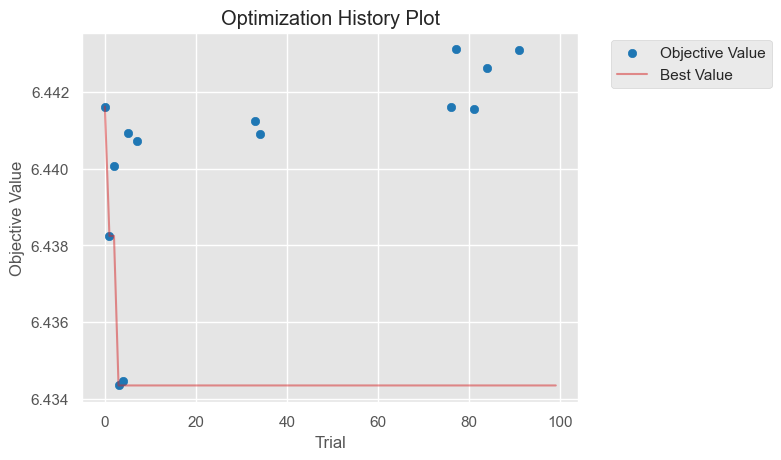

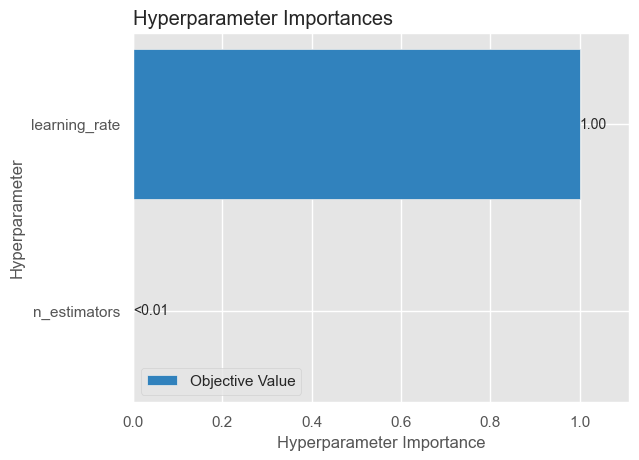

In [4]:
plot_optimization_history(study)
plot_param_importances(study)

 Check the optimization history and param_importances

	Best value (mse): 6.43435
	Best params:
		n_estimators: 10000
		learning_rate: 0.0018958897208476253


<ipython-input-5-4e8234e1ed11>:6: ExperimentalWarning: plot_optimization_history is experimental (supported from v2.2.0). The interface can change in the future.
  plot_optimization_history(study)
<ipython-input-5-4e8234e1ed11>:7: ExperimentalWarning: plot_param_importances is experimental (supported from v2.2.0). The interface can change in the future.
  plot_param_importances(study)


<Axes: title={'left': 'Hyperparameter Importances'}, xlabel='Hyperparameter Importance', ylabel='Hyperparameter'>

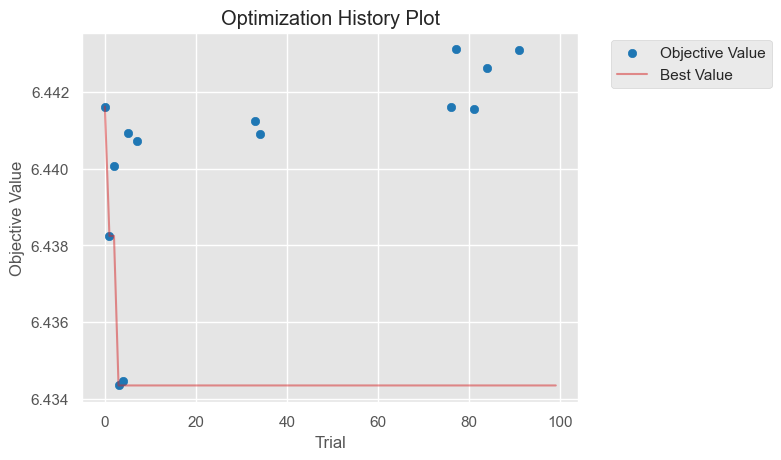

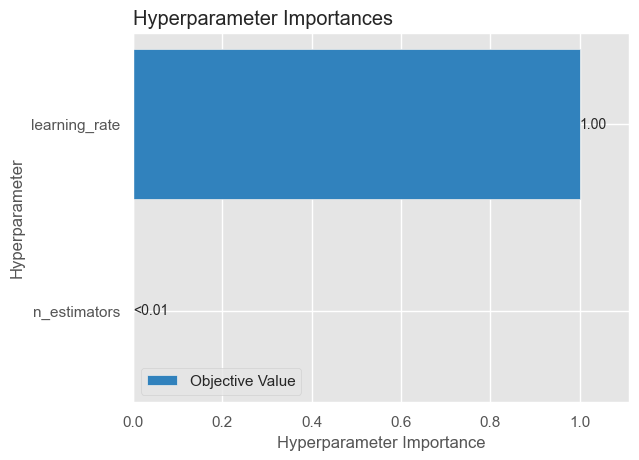

In [5]:
print(f"\tBest value (mse): {study.best_value:.5f}")
print(f"\tBest params:")

for key, value in study.best_params.items():
    print(f"\t\t{key}: {value}")
plot_optimization_history(study)
plot_param_importances(study)